<a id="intro"></a>
# Исследование рынка заведений общественного питания Москвы

**Описание проекта**

Заказчики — инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. 

1. Необходимо подготовить исследование рынка Москвы:
    - найти интересные особенности
    - презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места

2. Сделать детальное исследование для открытия кофейни:

    - мечта заказчиков — открыть в Москве такую же крутую и доступную кофейню как в сериале "Друзья"
    - заказчики не боятся конкуренции в этой сфере
    - необходимо определить, осуществима ли мечта заказчиков

**Содержание**:
1. [Исследование рынка Москвы](#analyze_data)
2. [Исследование для открытия кофейни](#open_coffee)
3. [Презентация](https://disk.yandex.ru/i/ikMulaysJvR8gg)

 👉 **[Итоги исследования](#research_results)**

**Описание данных**

В таблице `moscow_places.csv` датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация носит исключительно справочный характер:
- `name` — название заведения,
- `address` — адрес заведения,
- `category` — категория заведения,
- `hours` — информация о днях и часах работы,
- `lat` — широта географической точки заведения,
- `lng` — долгота географической точки заведения,
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах,
- `price` — категория цен в заведении,
- `avg_bill` — строка, средняя стоимость заказа в виде диапазона,
- `middle_avg_bill` — число с оценкой среднего чека,
- `middle_coffee_cup` — число с ценой одной чашки капучино,
- `chain` — число, 0 — заведение не является сетевым, 1 — заведение является сетевым,
- `district` — административный район заведения,
- `seats` — количество посадочных мест

## Общая информация о данных

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
import os
import seaborn as sns
import numpy as np
from datetime import datetime as dt
import matplotlib.ticker as mticker
from plotly import graph_objects as go
import sys
from folium import Map, Choropleth, Marker, DivIcon
from folium.plugins import MarkerCluster
import scipy.stats as st

In [2]:
# проверка на возможность выполнения Mardown
if 'ipykernel' in sys.modules:
    flag_md = 1
else:
    flag_md = 0

In [3]:
# чтение файла с данными и сохранение в датафрейм
dir1 = '/datasets/'
dir2 = '/Users/alexslobodskoj/Data_Analyst/'
places_pth = 'moscow_places.csv'


if os.path.exists(dir1):
    df_places = pd.read_csv(dir1 + places_pth)
elif os.path.exists(dir2):
    df_places = pd.read_csv(dir2 + places_pth)
else:
    print('Something is wrong')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


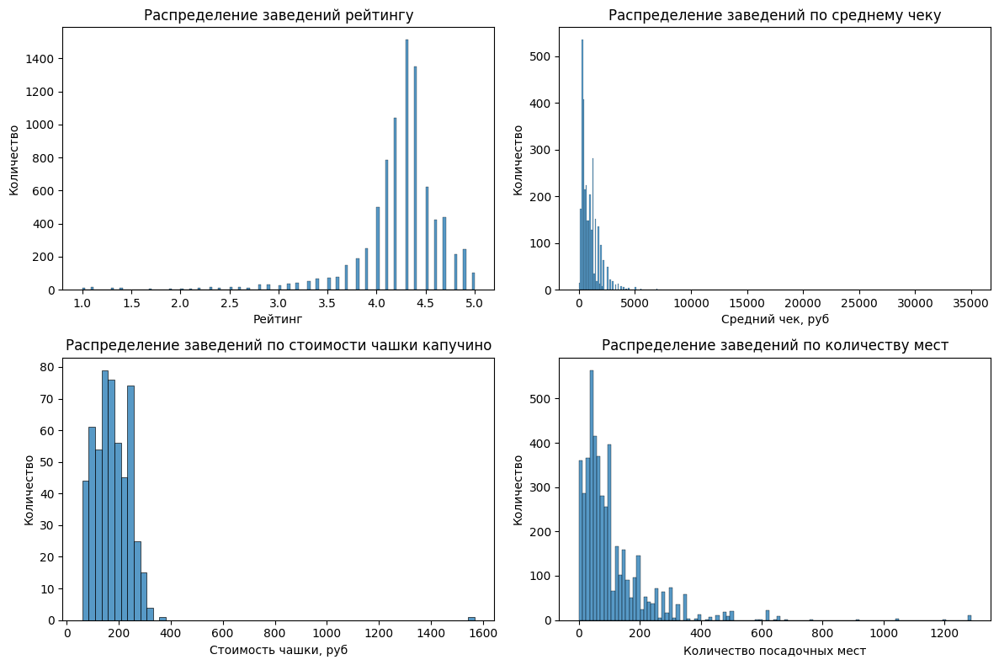

In [4]:
# датафрейм о заведениях
# вывод первых 5 строчек 
display(df_places.head())

# вывод основной информации
df_places.info()

# задание размера области графиков
plt.figure(figsize=(12, 8))

# гистограмма для столбца 'rating'
plt.subplot(2, 2, 1)
sns.histplot(df_places['rating'])
plt.title('Распределение заведений рейтингу')
plt.ylabel('Количество')
plt.xlabel('Рейтинг')

# гистограмма для столбца 'middle_avg_bill'
plt.subplot(2, 2, 2)
sns.histplot(df_places['middle_avg_bill'])
plt.title('Распределение заведений по среднему чеку')
plt.ylabel('Количество')
plt.xlabel('Средний чек, руб')

# гистограмма для столбца 'middle_coffee_cup'
plt.subplot(2, 2, 3)
sns.histplot(df_places['middle_coffee_cup'])
plt.title('Распределение заведений по стоимости чашки капучино')
plt.ylabel('Количество')
plt.xlabel('Стоимость чашки, руб')

# гистограмма для столбца 'seats'
plt.subplot(2, 2, 4)
sns.histplot(df_places['seats'])
plt.title('Распределение заведений по количеству мест')
plt.ylabel('Количество')
plt.xlabel('Количество посадочных мест')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. В таблице данные о **8406** заведениях

2. В таблице есть пропущенные значений - нужно определить возможность их заполнения

3. Необходимо добавить столбцы:

    - `street` с названиями улиц
    - `is_24_7` с признаком круглосуточной работы

5. Необходимо изменить тип столбцов `middle_avg_bill`, `middle_coffee_cup`, `seats` на целочисленный

6. Таблицу необходимо проверить на наличие дубликатов

7. В столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats` есть выбросы и аномальные значения

## Предобработка данных

### Изменение типа столбцов

Изменим тип столбцов `middle_avg_bill`, `middle_coffee_cup`, `seats` на целочисленный

In [5]:
# запись названий столбцов в список
columns_to_convert = ['middle_avg_bill', 'middle_coffee_cup', 'seats']

# изменение типа данных в столбцах
for col in columns_to_convert:
    df_places[col] = \
    (
        df_places[col]
        .round()
        .astype(pd.Int64Dtype())
    )

### Добавление столбцов

Добавим столбец `street` с названиями улиц из `address` и столбец `is_24_7` с признаком ежедневной+круглосуточной работы из `hours`

In [6]:
# создание столбца `street`
df_places['street'] = df_places['address'].str.extract(r',\s*([^,]+),')
df_places['street'] = df_places['street'].fillna(df_places['address'].str.split(', ').str[1])

In [7]:
# создание столбца `is_24_7`
df_places['is_24_7'] = (
    df_places['hours'].str.contains("ежедневно", na=False) &
    df_places['hours'].str.contains("круглосуточно", na=False)
)

### Проверка наличия дубликатов

Проверим наличие явных дубликатов

In [8]:
# вывод названий таблиц и количество явных дубликатов в них
message = (
    f'Удалим **{df_places.duplicated().sum()}**'
    f' явных дубликатов строк'
) if df_places.duplicated().sum() > 0 else f'Нет явных дубликатов в таблице'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Нет явных дубликатов в таблице

Проверим наличие неявных дубликатов в столбцах `category`, `district` и `price`

In [9]:
# запись названий столбцов в список
columns_to_convert = ['category', 'district', 'price']

# # вывод значений каждого столбца
for col in columns_to_convert:
    display(df_places[col].value_counts(sort=True, ascending=False, dropna=True))
    print()

category
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

price
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: count, dtype: int64

Неявных дубликатов в столбцах `category`, `district` и `price` не обнаружено.

Проверим наличие **дубликатов заведений по одному адресу**. Для этого унифицируем адрес и названия заведений и запишем их во временные столбцы.

In [10]:
# создание унифицированного столбца с адресом
df_places['address_uni'] = \
(
    df_places['address']
    .str.replace('Москва, ', '', regex=False)
    .str.replace(', стр. ', 'с', regex=False)  
    .str.replace(', корп. ', 'к', regex=False)          
    .str.replace('  ', ' ', regex=False)  
    .str.replace(',', '', regex=False)
    .str.lower()
)

# создание унифицированного столбца с именем
df_places['name_uni'] = \
(
    df_places['name']
    .str.lower()
    .str.replace('  ', ' ', regex=False)
    .str.replace(',', '', regex=False)
)

# поиск дублей
df_agg = \
(
    df_places
    .groupby(['name_uni', 'address_uni'])
    .size()
    .reset_index(name='count')
    .query('count > 1')
)

# проверка на дубли
if (df_agg['count'] > 1).any():
    
    message = (
        f'Есть **{len(df_agg)}** дубликатов заведений по одному адресу.\n\n'
        f'Оставим первое вхождение дубликата для дальнейшего анализа.'
    )
    
else:
    message = (
        f'Нет дубликатов заведений по одному адресу.'
    )
    
# вывод сообщения про дубликаты 
if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Есть **5** дубликатов заведений по одному адресу.

Оставим первое вхождение дубликата для дальнейшего анализа.

In [11]:
# удаление дубликатов
df_places.drop_duplicates(
    subset=['address_uni', 'name_uni'], 
    keep='first',
    inplace=True
)

# удаление временных столбцов
df_places.drop(['address_uni', 'name_uni'], axis=1, inplace=True)

### Обработка выбросов и аномальных значений

Оценим числовое распределение **среднего чека**.

In [12]:
# числовое описание распределения серднего чека
df_places['middle_avg_bill'].describe()

count         3149.0
mean      958.053668
std      1009.732845
min              0.0
25%            375.0
50%            750.0
75%           1250.0
max          35000.0
Name: middle_avg_bill, dtype: Float64

Заменим нулевые значения среднего чека медианными значениями среднего чека по категориям.

In [13]:
# фильтр заведений с нулевым средним чеком
filter_places = df_places.query('middle_avg_bill == 0').index

# заполнение нулевых значений средними значениями из категории
df_places.loc[filter_places, 'middle_avg_bill'] = \
(
    df_places
    .groupby(['category'])['middle_avg_bill']
    .transform(lambda x: int(x.median()))
)

И оценим графическое распределение.

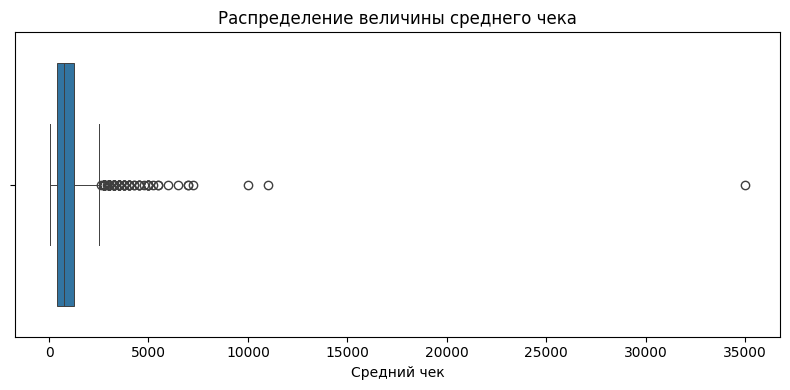

In [14]:
# вывод графика распределения среднего чека
plt.figure(figsize=(8, 4))
sns.boxplot(
data=df_places,
x='middle_avg_bill',
linewidth=.7
)
plt.title('Распределение величины среднего чека')
plt.ylabel('')
plt.xlabel('Средний чек')
plt.tight_layout()
plt.show()

Исключим из дальнейшего анализа 3 заведения со средним чеком от 10 тыс. руб.

In [15]:
# удаление строк со средним чеком больше или равно 10 тыс.руб.
df_places.drop(df_places.query('middle_avg_bill >= 10000').index, inplace=True)

Оценим числовое и графическое распределение **стоимости чашки капучино**.

In [16]:
df_places['middle_coffee_cup'].describe()

count         535.0
mean     174.721495
std       88.951103
min            60.0
25%           124.5
50%           169.0
75%           225.0
max          1568.0
Name: middle_coffee_cup, dtype: Float64

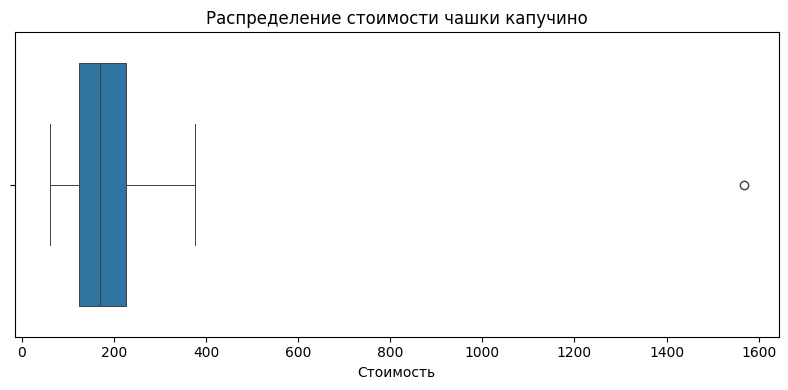

In [17]:
# вывод графика распределения стоимости чашки капучино
plt.figure(figsize=(8, 4))
sns.boxplot(
data=df_places,
x='middle_coffee_cup',
linewidth=.7
)
plt.title('Распределение стоимости чашки капучино')
plt.ylabel('')
plt.xlabel('Стоимость')
plt.tight_layout()
plt.show()

Исправим ошибочную стоимость чашки капучино в одном заведении. 

In [18]:
# исправление стоимости чашки капучино
filter_places = df_places.query('middle_coffee_cup > 1000').index
df_places.loc[filter_places, 'middle_coffee_cup'] = 260

Оценим числовое и графическое распределение **количества посадочных мест**.

In [19]:
df_places['seats'].describe()

count        4790.0
mean     108.375574
std      122.863723
min             0.0
25%            40.0
50%            75.0
75%           140.0
max          1288.0
Name: seats, dtype: Float64

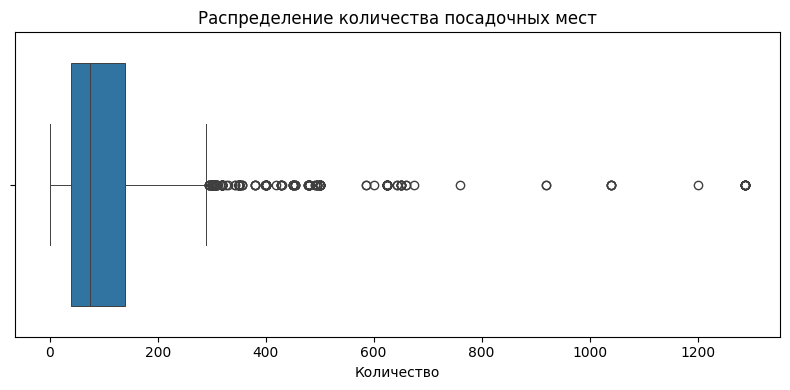

In [20]:
# вывод графика распределения количества посадочных мест
plt.figure(figsize=(8, 4))
sns.boxplot(
data=df_places,
x='seats',
linewidth=.7
)
plt.title('Распределение количества посадочных мест')
plt.ylabel('')
plt.xlabel('Количество')
plt.tight_layout()
plt.show()

Заменим нулевoе количество посадочных мест медианными значениями посадочных мест по категориям.

In [21]:
# фильтр заведений по количеству мест
filter_places = df_places['seats'] == 0

# заполнение нулевых значений средними значениями из категории
df_places.loc[filter_places, 'seats'] = \
(
    df_places
    .groupby(['category'])['seats']
    .transform(lambda x: int(x.median()))
)

### Обработка пропущенных значений

Рассчитаем процент пропущенных значений.

In [22]:
# вывод информации о доле пропущенных значений
na_series = df_places.isna().sum() > 0
df_na = pd.DataFrame(df_places.isna().mean()[na_series])
df_na.style.format("{:.2%}").background_gradient('coolwarm')

,0
hours,6.37%
price,60.56%
avg_bill,54.60%
middle_avg_bill,62.54%
middle_coffee_cup,93.63%
seats,42.96%


Проверим возможность заполнить **пропуски стоимости чашки капучино** `middle_coffee_cup` из текста о среднем заказе `avg_bill`

In [23]:
# проверка наличия NA в `middle_coffee_cup` когда  `avg_bill` ∈ "Цена чашки"
count_na = len(df_places[
    df_places['avg_bill'].str.contains("Цена чашки", na=False) & 
    df_places['middle_coffee_cup'].isna()
])

# вывод возможного количества NA для заполнения
message = (
    f'Можно заполнить **{count_na}** пропущенных значений в `middle_coffee_cup`'
) if count_na > 0 else f'Нет пропусков в `middle_coffee_cup` для заполнения из `avg_bill`'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Нет пропусков в `middle_coffee_cup` для заполнения из `avg_bill`

Проверим возможность заполнить **пропуски в тексте о среднем заказе** `avg_bill` из стоимости чашки капучино`middle_coffee_cup` 

In [24]:
# проверка наличия NA в `avg_bill` когда `middle_coffee_cup` непустое
count_na = len(df_places[
    df_places['avg_bill'].isna() & 
    df_places['middle_coffee_cup'].notna()
])
# вывод возможного количества NA для заполнения
message = (
    f'Можно заполнить **{count_na}** пропущенных значений в `avg_bill`'
) if count_na > 0 else f'Нет пропусков в `avg_bill` для заполнения из `middle_coffee_cup`'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Нет пропусков в `avg_bill` для заполнения из `middle_coffee_cup`

Проверим возможность заполнить **пропуски в среднем чеке** `middle_avg_bill` из текста о среднем заказе `avg_bill`

In [25]:
# проверка наличия NA в `middle_avg_bill` когда  `avg_bill` ∈ "Средний счёт"
count_na = len(df_places[
    df_places['avg_bill'].str.contains("Средний счёт", na=False) & 
    df_places['middle_avg_bill'].isna()
])

# вывод возможного количества NA для заполнения
message = (
    f'Можно заполнить **{count_na}** пропущенных значений в `middle_avg_bill`'
) if count_na > 0 else f'Нет пропусков в `middle_avg_bill` для заполнения из `avg_bill`'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Нет пропусков в `middle_avg_bill` для заполнения из `avg_bill`

Проверим возможность заполнить пропуски **в тексте о среднем заказе** `avg_bill` из среднего чека `middle_avg_bill` 

In [26]:
# проверка наличия NA в `avg_bill` когда `middle_coffee_cup` непустое
count_na = len(df_places[
    df_places['avg_bill'].isna() & 
    df_places['middle_avg_bill'].notna()
])
# вывод возможного количества NA для заполнения
message = (
    f'Можно заполнить **{count_na}** пропущенных значений в `avg_bill`'
) if count_na > 0 else f'Нет пропусков в `avg_bill` для заполнения из `middle_avg_bill`'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

Нет пропусков в `avg_bill` для заполнения из `middle_avg_bill`

Заполним пропуски в **категории цен для кофеен** `price` , у которых указана стоимость чашки капучино. Для присвоения категории цен используем медианную стоимость чашки капучино по каждой категории цен.

In [27]:
# датафрейм цен чашки капучино в кофейнях
df_agg = \
(
    df_places
    .query('category == "кофейня"')
    .groupby(['category', 'price'], as_index=False)['middle_coffee_cup']
    .median()
    .dropna()
    .sort_values(by='middle_coffee_cup')
)

# функция для определения категории на основе цены чашки капучино
def price_from_cup(row, df):
    
    if row['middle_coffee_cup'] <= df['middle_coffee_cup'].min():
        return 'низкие'
    elif row['middle_coffee_cup'] > df['middle_coffee_cup'].max():
        return 'высокие'
    
    for index, row_df in df.iterrows():
        if row['middle_coffee_cup'] <= row_df['middle_coffee_cup']:
            return row_df['price']
    
    return None

# фильтр заведений с пропущенными категориями цен
filter_places = \
(
    df_places['price'].isna() & 
    df_places['middle_coffee_cup'].notna()&
    (df_places['category'] == "кофейня")
)

# заполнение пропусков категорий цен
df_places.loc[filter_places, 'price'] = df_places.loc[filter_places].apply(
    lambda row: price_from_cup(row, df_agg), axis=1
)

Заполним пропуски в **стоимости чашки капучино для кофеен** `middle_coffee_cup`, у которых указан уровень цен `price`.

In [28]:
# добавление нового столбца через объединение
df_places = df_places.merge(df_agg, on=['category', 'price'], how='left', suffixes=('', '_df_agg'))

# фильтр заведений с пропусками в стоимости чашки кофе
filter_places = \
(
    df_places['middle_coffee_cup'].isna() & 
    df_places['price'].notna() &
    (df_places['category'] == "кофейня")
)

# заполнение пропущенных значений 'middle_coffee_cup'
df_places.loc[filter_places, 'middle_coffee_cup'] = df_places.loc[filter_places, 'middle_coffee_cup_df_agg']

# удаление промежуточного столбца
df_places.drop('middle_coffee_cup_df_agg', axis=1, inplace=True)

Заполним пропуски в **категории цен для заведений** `price`, у которых указан размер среднего чека. Для присвоения категории цен используем медианный размер среднего чека по каждой из категорий заведения.

In [29]:
# датафрейм среднего чека по категориям заведений
df_agg = \
(
    df_places
    .groupby(['category', 'price'], as_index=False)['middle_avg_bill']
    .median()
    .dropna()
)
df_agg['middle_avg_bill'] = \
(
    df_agg['middle_avg_bill']
    .astype(pd.Int64Dtype())
)

# функция для определения категории на основе среднего чека
def price_from_bill(row, df_agg):
    if row['middle_avg_bill'] <= df_agg['middle_avg_bill'].min():
        return 'низкие'
    elif row['middle_avg_bill'] > df_agg['middle_avg_bill'].max():
        return 'высокие'
    
    for index, row_df_agg in df_agg.iterrows():
        if row['middle_avg_bill'] <= row_df_agg['middle_avg_bill']:
            return row_df_agg['price']
    
    return None

# фильтр заведений с пропущенными категориями цен
filter_places = df_places['price'].isna() & df_places['middle_avg_bill'].notna()

# заполнение пропусков категорий цен
df_places.loc[filter_places, 'price'] = \
(
    df_places.loc[filter_places]
    .apply(
        lambda row: price_from_bill(
            row, 
            df_agg[df_agg['category'] == row['category']].sort_values(by='middle_avg_bill')
        ), axis=1
    )
)

Заполним пропуски в **размере среднего чека** `middle_avg_bill` для заведений, у которых указан уровень цен `price`.

In [30]:
# фильтр заведений с пропусками в среднем чеке
filter_places = \
(
    df_places['middle_avg_bill'].isna() & 
    df_places['price'].notna()
)

# добавление нового столбца через объединение
df_places = df_places.merge(df_agg, on=['category', 'price'], how='left', suffixes=('', '_df_agg'))

# заполнение пропущенных значений 'middle_avg_bill'
df_places.loc[filter_places, 'middle_avg_bill'] = df_places.loc[filter_places, 'middle_avg_bill_df_agg']

# удаление промежуточного столбца
df_places.drop('middle_avg_bill_df_agg', axis=1, inplace=True)

<div style="border:solid gray 1px; padding: 20px">

**Выводы**:
  
1. Добавили новые столбцы:

    - `street` с названиями улиц и
    - `is_24_7` с признаком круглосуточной работы

2. Явные и неявные дубликаты в таблицах не обнаружены

3. Изменили тип столбцов `middle_avg_bill`, `middle_coffee_cup`, `seats` на целочисленный

4. Заполнили пропуски возможными значениями

5. Обработали аномальные значения и выбросы

<a id="analyze_data"></a>
## Исследование рынка Москвы

### Распределение заведений по категориям

Исследуем количество объектов общественного питания по категориям. Оценим распределение заведений по категориям в числовом виде.

In [31]:
# количество заведений по категориям
cat_count = df_places['category'].value_counts().reset_index()
cat_count.columns = ['Категория', 'Количество']
cat_count

,Категория,Количество
0,кафе,2376
1,ресторан,2040
2,кофейня,1412
3,"бар,паб",763
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


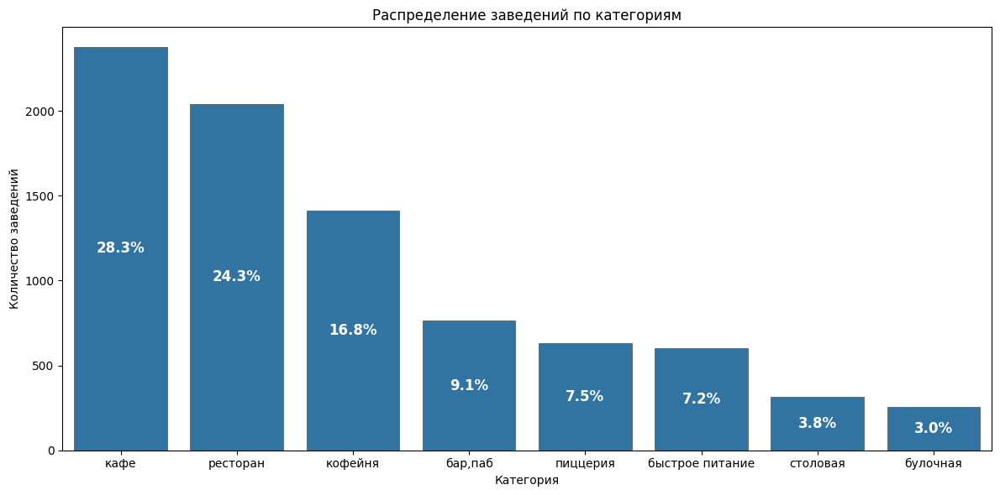

In [64]:
# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.countplot(
    data=df_places,
    x="category", 
    edgecolor=".3",
    linewidth=.5,
    order=cat_count['Категория'],
    color='#1f77b4'
)
# общее количество заведений
total_count = len(df_places)

# добавление подписей
for patch in ax.patches:
    ax.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_height() / 2,  
        f'{round((patch.get_height() / total_count) * 100, 1)}%',  
        ha='center',  
        va='center',  
        fontsize=12,
        color='white',
        fontweight='bold'
    )
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы**
1. Больше всего заведений в категории **кафе**

2. Тройка лидеров по количеству заведений: **кафе, ресторан, кофейня**
   
3. Меньше всего **столовых и булочных**

### Анализ количества посадочных мест

Оценим графическое распределение количества посадочных мест по заведениям. Исключим на графике заведения с количеством мест более 400.

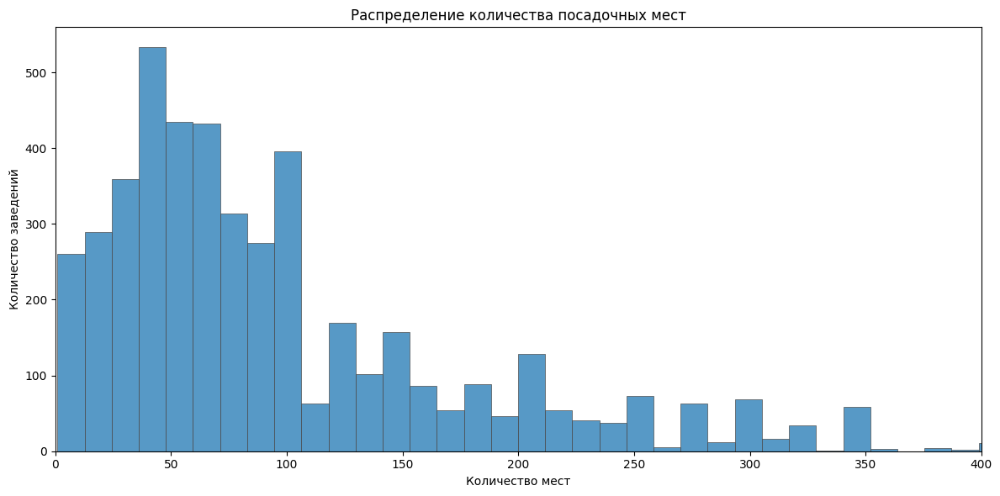

In [33]:
# вывод гистограммы
plt.figure(figsize=(12, 6))
sns.histplot(
    data = df_places,
    x="seats", 
    edgecolor=".3",
    linewidth=.5
)
plt.title('Распределение количества посадочных мест')
plt.ylabel('Количество заведений')
plt.xlabel('Количество мест')
plt.xlim(0,400)
plt.tight_layout()
plt.show()

Оценим распределение медианного количества посадочных мест по категориям заведений.

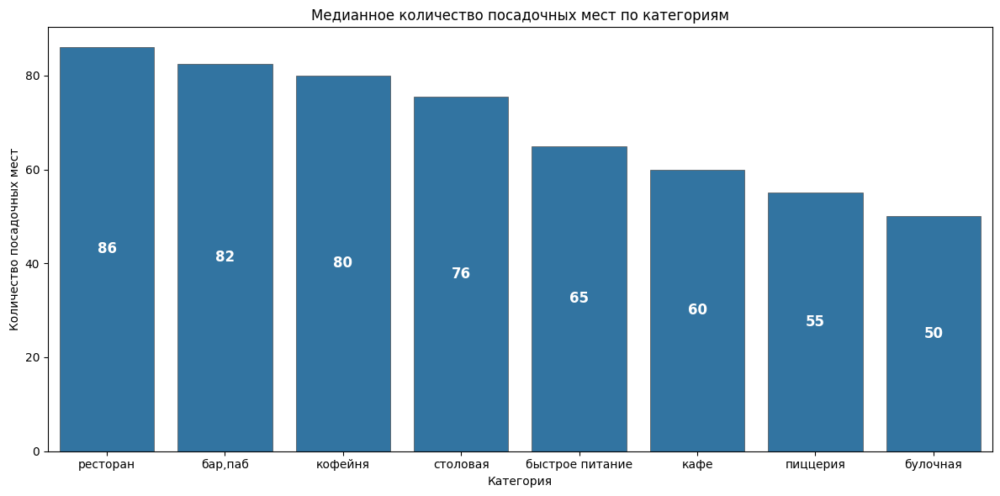

In [34]:
# формирование таблицы для графика
df_agg = \
(
    df_places
    .groupby('category')['seats']
    .median()
    .sort_values(ascending=False)
    .reset_index()
)

# вывод графика количества посадочных мест
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=df_agg,
    x="category",
    y="seats",
    edgecolor=".3",
    linewidth=.5,
    color='#1f77b4',
    errorbar=None
)
# добавление подписей
for patch in ax.patches:
    ax.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_height() / 2,  
        f'{round(patch.get_height())}',  
        ha='center',  
        va='center',  
        fontsize=12,
        color='white',  
        fontweight='bold'
    )
plt.title('Медианное количество посадочных мест по категориям')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы**
1. Чаще всего заведения вмещают **40-50** или около **100** посетителей

2. Тройка лидеров по медианному количеству посадочных мест **ресторан, бар/паб, кофейня**.

### Анализ соотношения сетевых/несетевых заведений

Оценим числовое и графическое распределение сетевых/несетевых заведений.

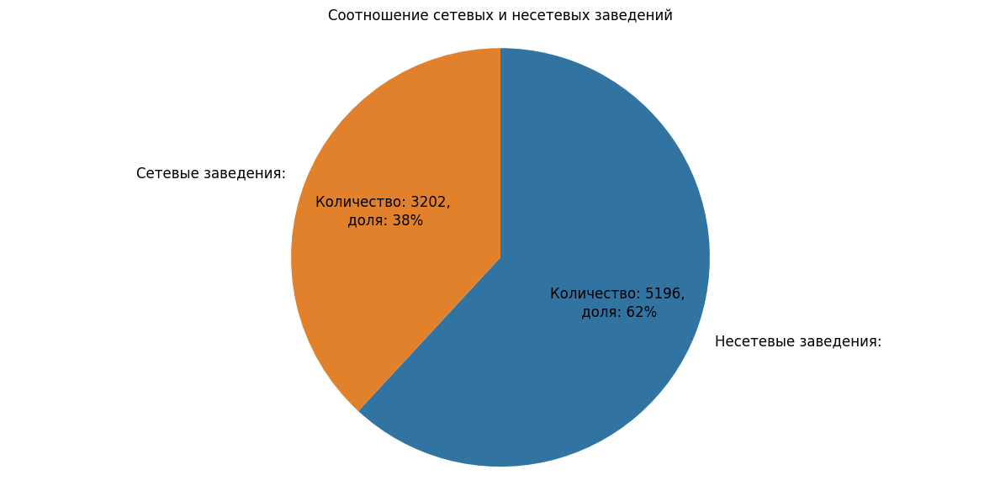

In [35]:
# группировка по сетевому признаку
df_agg = df_places.groupby('chain', as_index=False).size()

# функция для отображения подписей
def label_pct(pct, allusers):
    absolute = round(pct / 100. * allusers.sum())
    return f'Количество: {absolute},\n доля: {pct:.0f}%'
    
# вывод круговой диаграммы 
plt.figure(figsize=(12, 6))
plt.pie(
    df_agg['size'],
    autopct=lambda pct: label_pct(pct, df_agg['size']),
    labels=[
        f'{"Несетевые заведения" if group == 0 else "Сетевые заведения"}:' 
        for group in df_agg['chain']
    ],
    startangle=90,
    colors=['#3274A1', '#E1812C'],
    textprops={'fontsize': 12},
    counterclock=False
)
plt.title('Соотношение сетевых и несетевых заведений')
plt.axis('equal')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Несетевых заведений:  **62%**
   
2. Сетевых заведений:  **38%**

### Анализ категорий сетевых заведений

Оценим какие категории заведений чаще являются сетевыми.

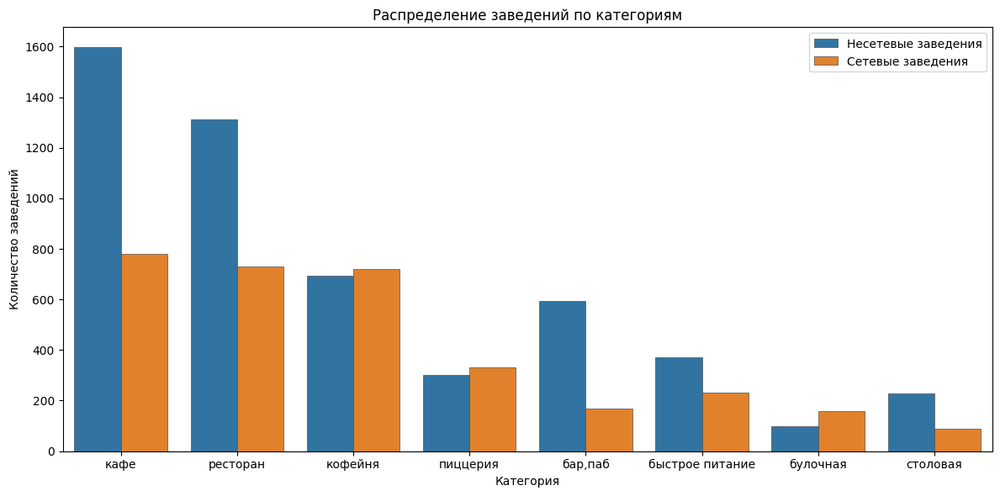

In [36]:
# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
sns.countplot(
    data=df_places,
    x="category", 
    edgecolor=".3",
    linewidth=.5,
    hue='chain'
)
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.legend(
    title='', 
    labels=[
        f'{"Несетевые заведения" if group == 0 else "Сетевые заведения"}' 
        for group in df_places['chain'].unique()
    ]
)
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Вывод:**

1. Чаще всего **кофейни, пиццерии и булочные** являются сетевыми заведениями
   
2. **Бары, пабы и столовые** чаще несетевые заведения

### Анализ топ-15 популярных сетей в Москве

Оценим количество популярных сетевых заведений в графическом виде.

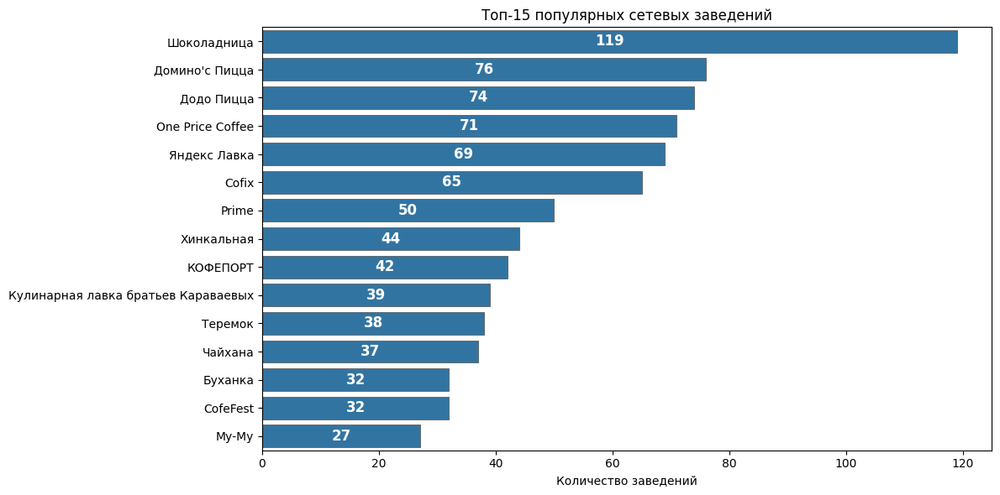

In [37]:
# топ-15 сетевых заведений
df_agg = \
(
    df_places
    .query('chain == 1')['name']
    .value_counts()
    .head(15)
    .reset_index()
)
df_agg.columns = ['name', 'count']

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.barplot(
    data=df_agg,
    x="count",
    y="name",
    edgecolor=".3",
    color='#1f77b4',
    linewidth=.5
)
# добавление подписей
for patch in ax.patches:
    ax.text(
        patch.get_width() / 2,
        patch.get_y() + patch.get_height() / 2,  
        f'{round(patch.get_width())}',  
        ha='center',  
        va='center',  
        fontsize=12,
        color='white',  
        fontweight='bold'
    )
plt.title('Топ-15 популярных сетевых заведений')
plt.ylabel('')
plt.xlabel('Количество заведений')
plt.tight_layout()
plt.show()

Оценим категории топ-15 сетевых заведений.

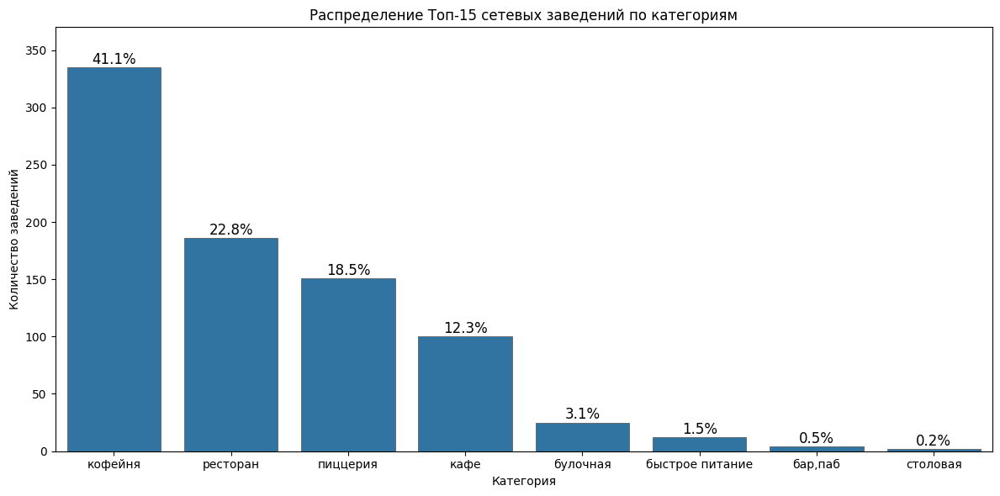

In [38]:
# создание датафрейма для графика
filter_places = df_agg['name']
df_filtered = df_places.query('name in @filter_places')

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.countplot(
    data=df_filtered,
    x="category", 
    edgecolor=".3",
    linewidth=.5,
    order=df_filtered['category'].value_counts().index,
    color='#1f77b4'
)
# общее количество заведений
total_count = len(df_filtered)

for patch in ax.patches:
    ax.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_height() + 0.1, 
        f'{round((patch.get_height() / total_count) * 100, 1)}%',
        ha='center',
        va='bottom',
        color='black',
        fontsize=12
    )
plt.title('Распределение Топ-15 сетевых заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.ylim(0, 370)
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Вывод**
1. Больше всего заведений в сети **Шоколадница**

2. Все топ-15 сетевых заведений:

    - относятся к сегменту быстрого питания
    - ориентированы на широкий круг потребителей - молодежь, студентов и семьи
    - предлагают доступные цены и удобные форматы обслуживания
   
3. Основные категории топ-15 сетевых заведений: **кофейня, ресторан, пиццерия**

### Анализ административных районов Москвы

Оценим распределение заведений по административным районам в числовом виде.

In [39]:
# числовое распределение заведений по районам
distr_count = df_places['district'].value_counts().reset_index()
distr_count.columns = ['Округ', 'Заведений']
distr_count

,Округ,Заведений
0,Центральный административный округ,2242
1,Северный административный округ,896
2,Южный административный округ,891
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,797
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


Оценим графичекое распределение категорий заведений по административным округам.

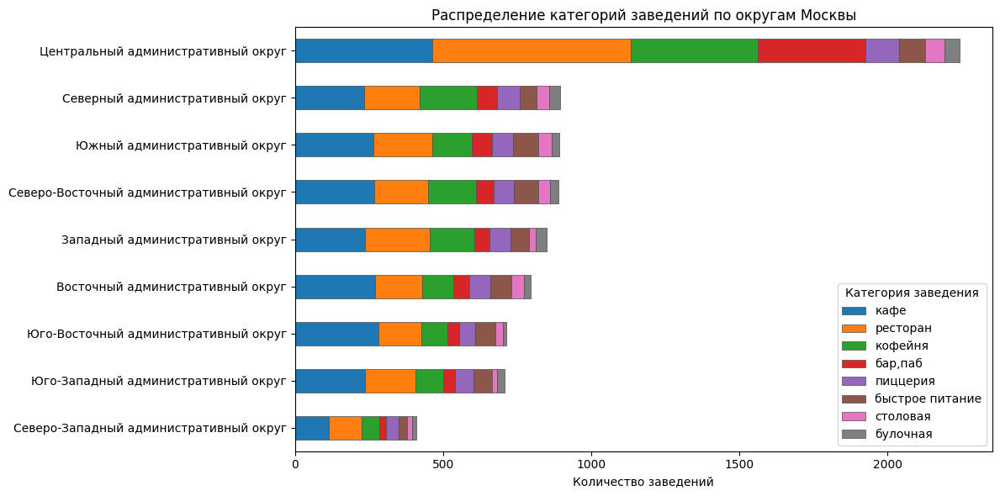

In [40]:
# группировка данных по районам и категориям
df_agg = (
    df_places
    .groupby(['district', 'category'])
    .size()
    .unstack(fill_value=0)
)
df_agg['total'] = df_agg.sum(axis=1)

# сортировка категорий
total_counts = df_agg.sum()
sorted_categories = total_counts.sort_values(ascending=False).index
df_agg = df_agg[sorted_categories]

# сортировка районов
df_agg = df_agg.sort_values(by='total', ascending=True)
df_agg.drop('total', axis=1, inplace=True)

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
with sns.color_palette():
    df_agg.plot(
        kind='barh',  
        stacked=True, 
        ax=plt.gca(), 
        edgecolor=".3", 
        linewidth=.5
    )
    
    plt.title('Распределение категорий заведений по округам Москвы')
    plt.xlabel('Количество заведений')  
    plt.ylabel('')
    plt.legend(title='Категория заведения')
    plt.tight_layout()
    plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Больше всего заведений в **Центральном административном округе**, пропорционально во всех категориях
   
2. Меньше всего заведений общественного питания в **Северо-Западном административном округе**

3. Во всех округах представлены заведения из всех категорий

5. Пропорциональное распределение категорий по округам примерно одинаковое в каждом округе

### Анализ средних рейтингов по категориям заведений
Оценим графически распределение средних рейтингов по категориям заведений.

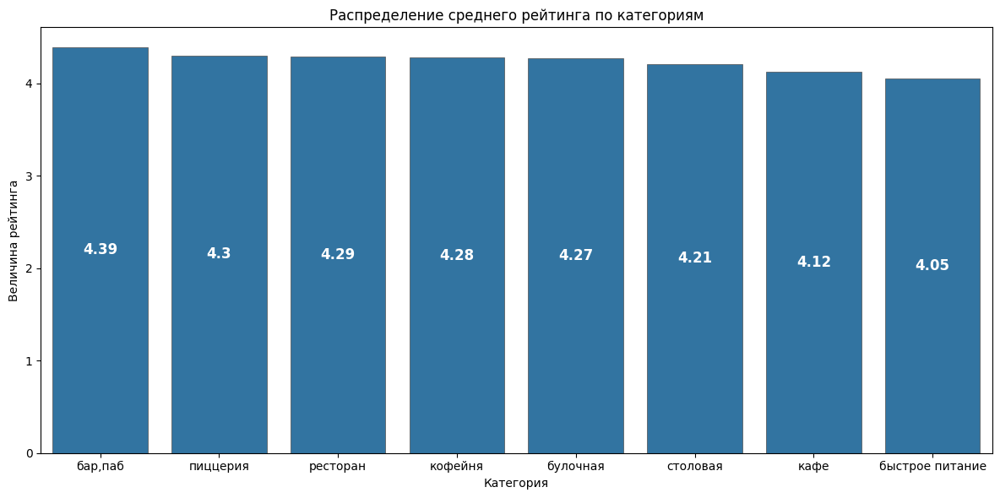

In [41]:
# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.barplot(
    data=df_places,
    x="category",
    y="rating",
    order=\
    (
        df_places
        .groupby('category')['rating']
        .mean()
        .sort_values(ascending=False)
        .index
    ),
    edgecolor=".3",
    linewidth=.5,
    errorbar=None,
    color='#1f77b4'
)
# добавление подписей
for patch in ax.patches:
    ax.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_height() / 2,  
        f'{round(patch.get_height(),2)}',  
        ha='center',  
        va='center',  
        fontsize=12,
        color='white',  
        fontweight='bold'
    )
plt.title('Распределение среднего рейтинга по категориям')
plt.ylabel('Величина рейтинга')
plt.xlabel('Категория')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Усреднённые рейтинги по категориям заведений отличаются не сильно
   
2. Самый высокий рейтинг у **баров, пабов**, а самый низкий у заведений **быстрого питания**

### Фоновая картограмма рейтингов по округам

Оценим распределение среднего рейтинга заведение по административным округам на карте.

In [42]:
# чтение JSON-файла и сохранение в переменную
geo_pth = 'admin_level_geomap.geojson'

if os.path.exists(dir1):
    state_geo = dir1 + geo_pth
elif os.path.exists(dir2):
    state_geo = dir2 + geo_pth
else:
    print('Something is wrong')

Создадим карту Москвы

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Покажем административные округа в соответствии со средним рейтингом заведений

In [44]:
# группировка данных по районам и рейтингу
df_agg = df_places.groupby('district', as_index=False)['rating'].mean()

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Самый высокий средний рейтинг заведений в **Центральном округе**
   
2. Также в тройке лидеров **Северный и Северо-Западный округа**

3. Самый низкий рейтинг в **Юго-Восточном округе**

### Кластерная карта всех заведений

Отобразим все заведения на карте с помощью кластеров.

In [45]:
# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создание пустого кластер
marker_cluster = MarkerCluster().add_to(m)

# функция для создания маркера и добавления его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# добавление каждого заведения в кластер
df_places.apply(create_clusters, axis=1)

# выводим карту
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Больше всего заведений общественного питания в **Центральном округе**
   
2. Плотность распределения заведений смещена в западную часть Москвы

### Анализ топ-15 улиц по количеству заведений

Оценим топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

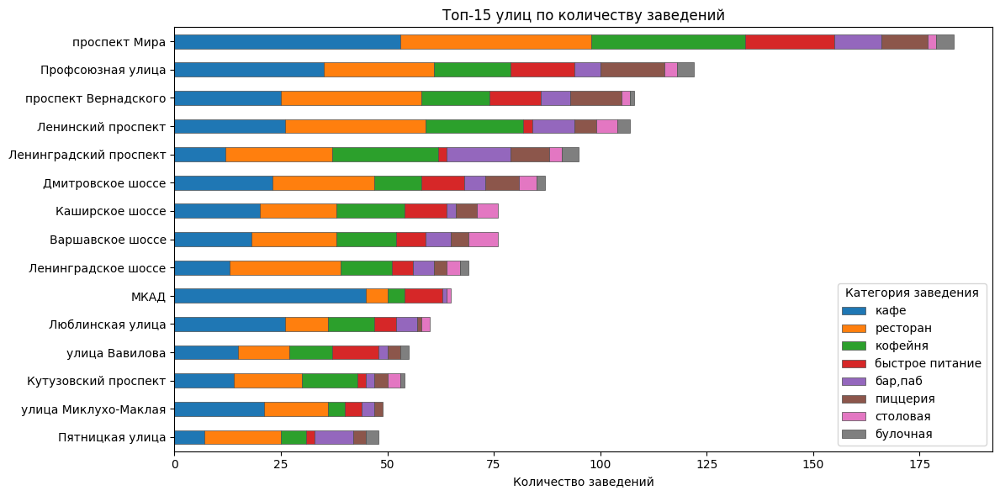

In [46]:
# группировка данных по улицам и категориям
df_agg = (
    df_places
    .groupby(['street', 'category'])
    .size()
    .unstack(fill_value=0)
)

# отбор топ-15 улиц по количеству заведений
df_agg['total'] = df_agg.sum(axis=1)
df_agg = df_agg.sort_values(by='total', ascending=False).head(15)

# сортировка категорий
total_counts = df_agg.sum()
sorted_categories = total_counts.sort_values(ascending=False).index
df_agg = df_agg[sorted_categories]

# сортировка улиц
df_agg = df_agg.sort_values(by='total', ascending=True)
df_agg.drop('total', axis=1, inplace=True)

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
with sns.color_palette():
    df_agg.plot(
        kind='barh',  
        stacked=True, 
        ax=plt.gca(), 
        edgecolor=".3", 
        linewidth=.5)
    
    plt.title('Топ-15 улиц по количеству заведений')
    plt.xlabel('Количество заведений')  
    plt.ylabel('')
    plt.legend(title='Категория заведения')
    plt.tight_layout()
    plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Больше всего заведений на **Проспекте Мира**
   
2. На разных улицах пропорциональное распределение на категории заведений не зависит от общего количества заведений. Например:

   - на МКАДе **кафе** примерно столько же как и на Проспекте Мира и почти нет **ресторанов и кофеен**
   - на Ленинградском проспекте и шоссе **кафе** значительно меньше чем **ресторанов** 

3. На некоторых улицах представлены не все категории заведений

### Анализ улиц с одним объектом общепита

Оценим количество улиц с одним заведением.

In [47]:
# исправление названия одной улицы
df_places['street'] = df_places['street'].replace("улица Шкулёва 4", "улица Шкулёва")

# группировка данных по улицам
df_agg = \
(
    df_places
    .groupby('street')
    .size()  
    .reset_index(name='count')
    .query('count == 1')
)

# вывод количества улиц
message = (
    f'В таблице **{df_agg["count"].sum()}** одноуличных заведений общепита\n\n'
    f'**{df_agg["count"].sum() / len(df_places):.2%}** от общего количества заведений'
) if df_agg['count'].sum() > 0 else f'В таблице нет улиц с одним заведением общепита'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

В таблице **457** одноуличных заведений общепита

**5.44%** от общего количества заведений

Оценим графически категории одноуличных заведений

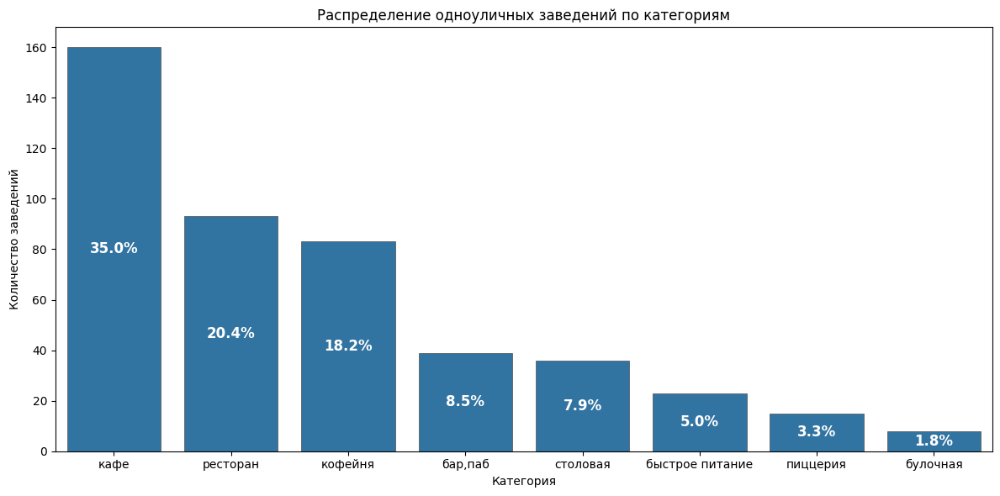

In [48]:
# создание датафрейма одноуличных заведений
filter_places = df_agg['street']
df_filtered = df_places.query('street in @filter_places').copy()

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.countplot(
    data=df_filtered,
    x="category", 
    edgecolor=".3",
    linewidth=.5,
    order=df_filtered['category'].value_counts().index,
    color='#1f77b4'
)
# общее количество одноуличных заведений
total_count = len(df_filtered)

# добавление подписей
for patch in ax.patches:
    ax.text(
        patch.get_x() + patch.get_width() / 2,  
        patch.get_height() / 2,  
        f'{round((patch.get_height() / total_count) * 100, 1)}%',  
        ha='center',  
        va='center',  
        fontsize=12,
        color='white',
        fontweight='bold'
    )
plt.title('Распределение одноуличных заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.tight_layout()
plt.show()

Оценим распределение доли улиц с одним заведением по округам.

In [49]:
# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# подготовка данных для вывода на карту
df_agg = df_filtered.groupby('district').size().reset_index(name='count')
df_agg['count_allstreet'] = \
(
    df_agg['district']
    .apply(lambda district: df_places[df_places['district'] == district]['street'].nunique())
)
df_agg['rate'] = df_agg['count'] / df_agg['count_allstreet']

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'rate'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Доля улиц с одним заведением общепита',
).add_to(m)

# вывод карты
m

Оценим время работы одноуличных заведений.

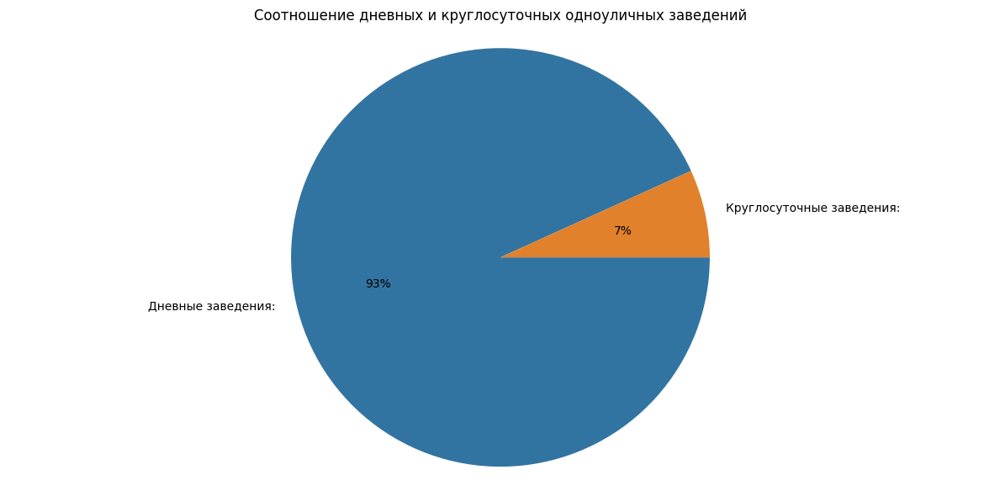

In [50]:
# группировка по сетевому признаку
df_agg = df_filtered.groupby('is_24_7').size().reset_index(name='count')

# функция для отображения подписей
def label_pct(pct, allusers):
    absolute = round(pct / 100. * allusers.sum())
    return f'{pct:.0f}%'
    
# вывод круговой диаграммы для`user_count` 
plt.figure(figsize=(12, 6))
plt.pie(
    df_agg['count'],
    autopct=lambda pct: label_pct(pct, df_agg['count']),
    labels=[
        f'{"Дневные заведения" if group == 0 else "Круглосуточные заведения"}:' 
        for group in df_agg['is_24_7']
    ],
    colors=['#3274A1', '#E1812C'],
    counterclock=False
)
plt.title('Соотношение дневных и круглосуточных одноуличных заведений')
plt.axis('equal')
plt.tight_layout()
plt.show()

Оценим графически распределение среднего рейтинга одноуличных/обычных заведений.

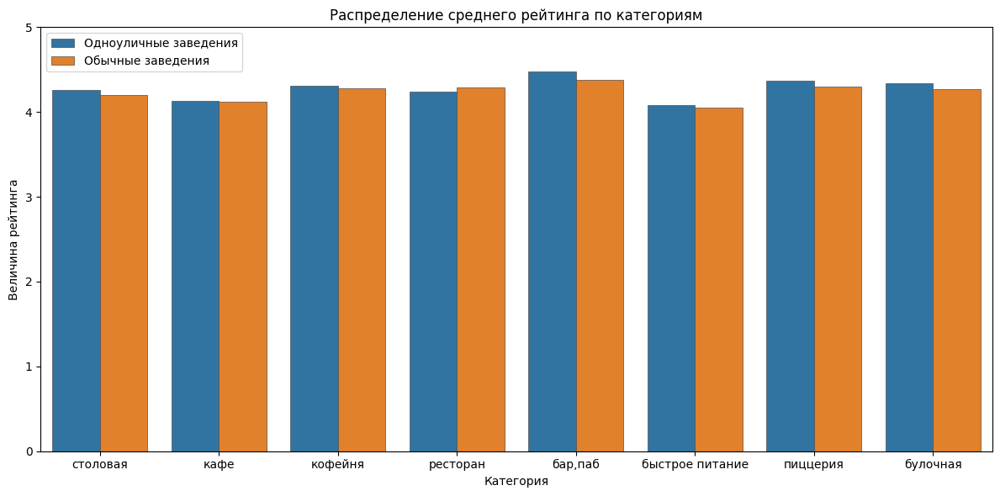

In [51]:
# подготовка таблиц для графика
df_filtered.loc[:, 'type'] = 'Одноуличные заведения'
df_usual = df_places.query('street not in @filter_places').copy()
df_usual.loc[:, 'type'] = 'Обычные заведения'
df_union = pd.concat([df_filtered, df_usual])

# задание размера графика
plt.figure(figsize=(12, 6))

# вывод графика
ax = sns.barplot(
    data=df_union,
    x="category",
    y="rating",
    edgecolor=".3",
    linewidth=.5,
    hue='type',
    palette=['#1f77b4', '#ff7f0e'],
    errorbar=None
)
plt.title('Распределение среднего рейтинга по категориям')
plt.ylabel('Величина рейтинга')
plt.xlabel('Категория')
plt.legend(title='', loc='upper left')
plt.yticks(np.arange(0, 6, 1))
plt.tight_layout()
plt.show()

Проверим различие между рейтингами с помощью **статистического теста**.

Выясним, одинаковые ли средние рейтинги одноуличных и обычных заведений.


**H0** - нулевая гипотеза:
- средние рейтинги заведений одинаковые

**H1** - альтернативная двусторонняя гипотеза
- средние рейтинги заведений различаются

Проверим гипотезу с помощью Т-критерия Стьюдента для независимых выборок. Если вероятность ошибочно отвергнуть нулевую гипотезу `p-value` окажется меньше уровня статистической значимости `alpha = 5%`, то отвергнем нулевую гипотезу в пользу альтернативной.

In [52]:
# задание уровня статистической значимости
alpha = 0.05

# выполнение t-теста с двусторонней альтернативной гипотезой
t_stat, p_value = st.ttest_ind(
    df_filtered['rating'], 
    df_usual['rating'], 
    alternative='two-sided'
)

# проверка гипотезы
if p_value < alpha:
    message = (
            f'p_value=**{p_value:.2e}** < {alpha:.2%}\n\n'
            f' Отвергаем нулевую гипотезу: средние рейтинги одноуличных/обычных ,\
            заведений отличаются.'
    )
else:
    message = (
            f'p_value=**{p_value:.2%}** >= {alpha:.2%}\n\n'
            f' Не удалось отвергнуть нулевую гипотезу: нет достаточных доказательств,\
            что средние рейтинги одноуличных/обычных отличаются.'
    )


# вывод резельтатов теста
if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

p_value=**81.64%** >= 5.00%

 Не удалось отвергнуть нулевую гипотезу: нет достаточных доказательств,            что средние рейтинги одноуличных/обычных отличаются.

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Проанализировали **456** одноуличных заведений общепита, **5,42%** от общего количества заведений
   
2. Тройка категорий-лидеров по количеству одноуличных заведений: **кафе, рестораны, кофейня**

3. В **Северном и Северо-Восточном** округах самая большая доля улиц с одним заведением

4. Подавляющее количество **93%** одноуличных заведений работают только в дневное время

5. Отсутствие конкурентов на улице не сказывается на качестве обслуживания - средние рейтинги по категориям одноуличных/обычных заведений не отличаются 

### Распределение размера среднего чека по округам

Оценим распределение медианного значения среднего чека заведения по административным округам на карте.

In [53]:
# группировка данных по районам
df_agg = df_places.groupby('district', as_index=False)['middle_avg_bill'].median()

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Размер среднего чека, руб.',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. В **Центральном административном округе** самые высокие цены
   
2. При удалении от центра цены снижаются, но неравномерно

   - **Западный округ** второй по уровню цен
   - затем идут **Северо-Западный и Юго-Западный округа**
   - и затем все остальные

3. Вероятно высокие цены западных направлений связаны с платежеспособностью жителей наиболее престижных районов Москвы

<a id="open_coffee"></a>
## Исследование для открытия кофейни

Оценим осуществимость мечты основателей фонда «Shut Up and Take My Money» открыть крутую и доступную кофейню в Москве.

### Количество и особенности расположения

Оценим количество кофеен в датасете.

In [54]:
# создание датафрейма кофеен
df_coff = df_places.query('category == "кофейня"').copy()

# вывод количества кофеен
message = (
    f'В таблице **{len(df_coff)}** кофеен\n\n'
    f'**{len(df_coff) / len(df_places):.2%}** от общего количества заведений'
) if len(df_coff) > 0 else f'В таблице нет кофеен'

if flag_md == 1:
    display(Markdown(message))
else:
    print(message.replace("*", ""))

В таблице **1412** кофеен

**16.81%** от общего количества заведений

Оценим числовое распределение по районам и особенности их расположения на карте Москвы.

In [55]:
# числовое распределение кофеен по районам
coff_count = df_coff['district'].value_counts().reset_index()
coff_count.columns = ['Округ', 'Кофейни']
coff_count

,Округ,Кофейни
0,Центральный административный округ,428
1,Северный административный округ,192
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [56]:
# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# подготовка данных для вывода на карту
df_agg = df_coff.groupby('district').size().reset_index(name='count')
df_agg['count_allstreet'] = \
(
    df_agg['district']
    .apply(lambda district: len(df_places[df_places['district'] == district]['street']))
)
df_agg['rate'] = df_agg['count'] / df_agg['count_allstreet']

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'rate'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Доля кофеен от всех заведений',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Всего для анализа есть данные о **1413** кофеен, **16.81%** от общего количества заведений
   
2. В **Центральном и Северном** округах не только больше всего кофеен, но и их доля от всех заведений выше

3. В **Восточном, Юго-Восточном и Юго-Западном** округах доля кофеен меньше всего

### Время работы кофеен

Оценим долю круглосуточных кофеен.

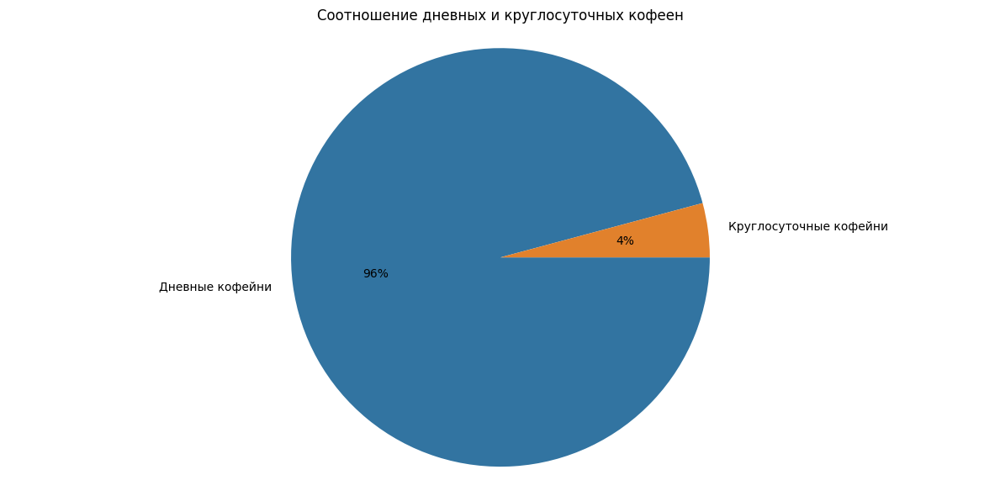

In [57]:
# группировка по сетевому признаку
df_agg = df_coff.groupby('is_24_7').size().reset_index(name='count')

# функция для отображения подписей
def label_pct(pct, allusers):
    absolute = round(pct / 100. * allusers.sum())
    return f'{pct:.0f}%'
    
# вывод круговой диаграммы для`user_count` 
plt.figure(figsize=(12, 6))
plt.pie(
    df_agg['count'],
    autopct=lambda pct: label_pct(pct, df_agg['count']),
    labels=[
        f'{"Дневные кофейни" if group == 0 else "Круглосуточные кофейни"}' 
        for group in df_agg['is_24_7']
    ],
    colors=['#3274A1', '#E1812C'],
    counterclock=False
)
plt.title('Соотношение дневных и круглосуточных кофеен')
plt.axis('equal')
plt.tight_layout()
plt.show()

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. В анализируемых данных почти нет круглосуточных кофеен - всего **4%**
   
2. Ночная кофейня может привлечь студентов, работников ночных смен и любителей поздних прогулок

3. Малое количество существующих круглосуточных кофеен может дать конкурентное преимущество

4. Для увеличения среднего чека можно предлагать закуски, десерты ...

### Рейтинги кофеен

Оценим распределение рейтингов в топ-10 сетевых кофейнях.

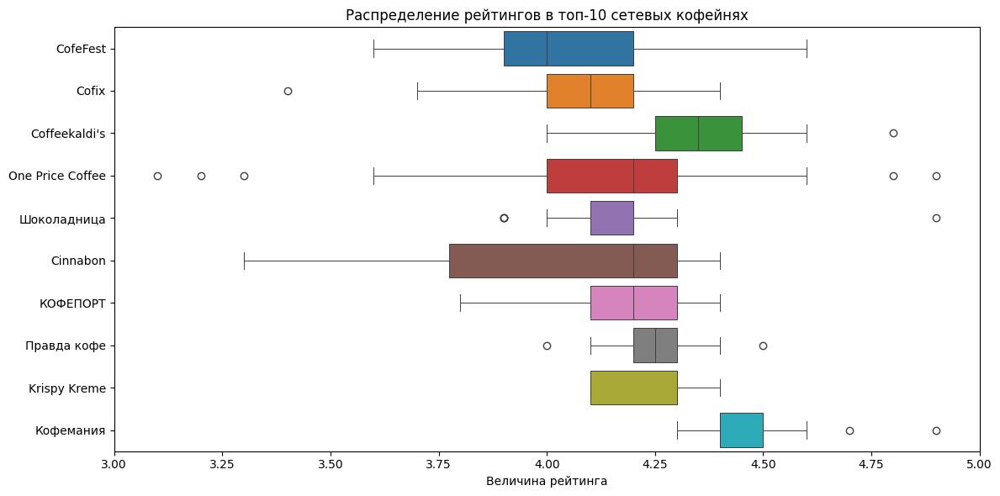

In [58]:
# подготовка таблиц для графика
filter_places = \
(
    df_coff
    .query('chain == 1')['name']
    .value_counts()
    .head(10)
    .index
)
df_filtered = df_coff.query('name in @filter_places')

# вывод графика
plt.figure(figsize=(12, 6))
with sns.color_palette():
    sns.boxplot(
        data=df_filtered,
        x='rating',
        y='name',
        hue='name',
        linewidth=.7
    )
    plt.title('Распределение рейтингов в топ-10 сетевых кофейнях')
    plt.ylabel('')
    plt.xlabel('Величина рейтинга')
    plt.xlim(3,5)
    plt.tight_layout()
    plt.show()

Оценим распределение среднего рейтинга всех кофеен по районам на карте

In [59]:
# группировка данных по районам
df_agg = df_coff.groupby('district', as_index=False)['rating'].mean()

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. Самый высокий рейтинг у **Кофемании** и **Coffeekaldi's**, с их кофейнями будет сложно конкурировать
   
2. Низкие рейтинги:

    - у всех кофеен **CofeFest, Cofix**
    - у некоторых кофеен **Cinnabon, One Price Coffee** - по необходимости нужно провести дополнительное иссследование в заданном районе

3. Средние рейтинги по районам:

   - высокие рейтинги в **Центральном и Северо-Западном** округах
   - низкие рейтинги в **Западном и Северо-Восточном** округах - в них будет проще конкурировать за счет оказания качественных услуг

### Стоимость чашки капучино

Оценим числовое распределение стоимости чашки капучино среди всех кофеен.

In [60]:
df_coff['middle_coffee_cup'].describe()

count         711.0
mean     179.962025
std       58.640513
min            60.0
25%           139.0
50%           200.0
75%           205.0
max           375.0
Name: middle_coffee_cup, dtype: Float64

Оценим графическое распределение стоимости чашки капучино.

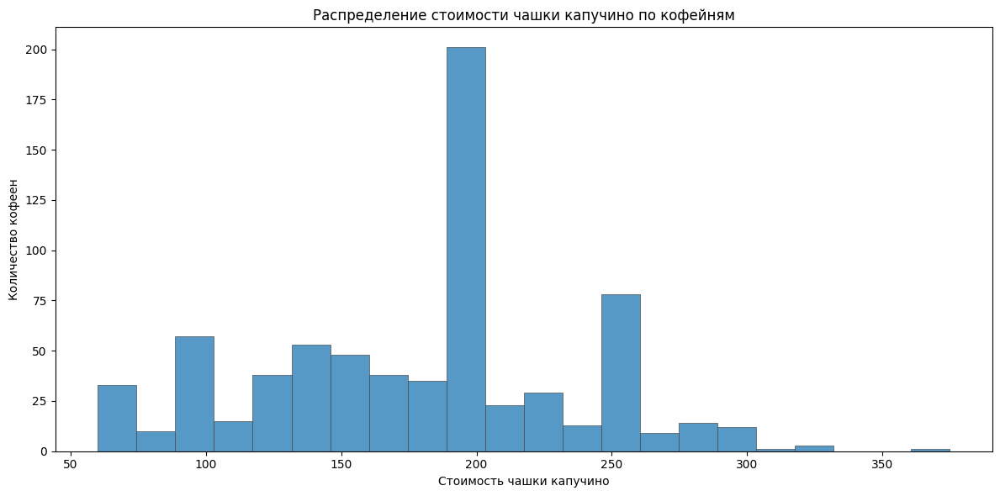

In [61]:
# вывод гистограммы
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_coff,
    x="middle_coffee_cup", 
    edgecolor=".3",
    linewidth=.5
)

plt.title('Распределение стоимости чашки капучино по кофейням')
plt.ylabel('Количество кофеен')
plt.xlabel('Стоимость чашки капучино')
plt.tight_layout()
plt.show()

Оценим распределение средней стоимости чашки капучино по районам Москвы.

In [62]:
# группировка данных по районам
df_agg = df_coff.groupby('district', as_index=False)['middle_coffee_cup'].mean()

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Cредняя стоимость чашки капучино',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Выводы:**

1. При открытии кофейни имеет смысл ориентироваться на стоимость чашки капучино в **200 руб.**
   
2. Не менее 50% кофеен используют такую цену и выше

3. По стоимости чашки капучино лидируют **Центральный, Западный и Юго-Западный** районы

### Круглосуточные кофейни по районам

Оценим распределение доли круглосуточных кофеен по административным округам.

In [63]:
# группировка данных по районам
df_agg = df_coff.groupby('district', as_index=False)['is_24_7'].mean()

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=df_agg,
    columns=['district', 'is_24_7'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Доля круглосуточных кофеен',
).add_to(m)

# вывод карты
m

<div style="border:solid gray 1px; padding: 20px">

**Вывод:**

1. Больше всего круглосуточных кофеен в **Юго-Западном** округе, а меньше всего в **Южном и Юго-Восточном** округах

<a id="research_results"></a>
## Итоги исследования

Результаты исследования помогут инвесторам из фонда «Shut Up and Take My Money» открыть заведение общественного питания в Москве.

[Презентация результатов исследования](https://disk.yandex.ru/i/ikMulaysJvR8gg)

**Исследование рынка общественного питания**:


1. Проанализировали **8406** заведений

   - тройка лидеров по количеству заведений:
       - кафе **28%**,
       - ресторан **24%**,
       - кофейня **17%**
   - меньше всего:
       - столовых **4%**
       - булочных **3%**
   - больше всего заведений в **Центральном** округе
   - плотность распределения заведений смещена в западную часть Москвы

2. Количество посадочных мест:

   - чаще всего заведения вмещают **40-50** или около **100** посетителей
   - тройка лидеров по среднему количеству посадочных мест **ресторан, бар/паб, кофейня**
  
3. Несетевых заведений **62%** - больше чем сетевых **38%**:

   - сетевые заведения чаще всего **кофейни, пиццерии и булочные**
   - несетевые чаще **бары, пабы и столовые**
    
4. Топ-15 популярных сетей в Москве
   - основные категории топ-15 сетевых заведений: **кофейня, ресторан, пиццерия**
   - больше всего заведений в сети **Шоколадница**
   - относятся к сегменту быстрого питания
   - ориентированы на широкий круг потребителей - молодежь, студентов и семьи
   - предлагают доступные цены и удобные форматы обслуживания

5. Распределение категорий заведений по административным округам

   - больше всего заведений в **Центральном** округе, пропорционально во всех категориях
   - меньше всего в **Северо-Западном** округе
   - во всех округах представлены заведения из всех категорий

6. Рейтинги заведений

   - тройка лидеров категорий по рейтингам **бары/пабы, пиццерия, ресторан**
   - самый высокий рейтинг у **баров, пабов**, а самый низкий у заведений **быстрого питания**
   - тройка лидеров районов по рейтингам **Центральный, Северный и Северо-Западный**
   - самый высокий средний рейтинг заведений в **Центральном** округе, а самый низкий в **Юго-Восточном** округе

7. Топ-15 улиц по количеству заведений

   - больше всего заведений на **Проспекте Мира**
  
   - на разных улицах категории заведений распределены непропорционально общему количеству заведений. Например:

       - на МКАДе **кафе** примерно столько же как и на Проспекте Мира и почти нет **ресторанов и кофеен**
       - на Ленинградском проспекте и шоссе **кафе** значительно меньше чем **ресторанов**
       - на некоторых улицах представлены не все категории заведений

8. **456** улиц с одним объектом общепита

   - тройка категорий-лидеров по количеству одноуличных заведений: **кафе, рестораны, кофейня**
   - в **Северном и Северо-Восточном** округах самая большая доля улиц с одним заведением
   - подавляющее количество **93%** одноуличных заведений работают только в дневное время
   - отсутствие конкурентов на улице не сказывается на качестве обслуживания - средний рейтинг по категориям одноуличных/обычных заведений почти не отличается

9. Размера среднего чека

   - в **Центральном административном** округе самые высокие цены
  
   - при удалении от центра цены снижаются, но неравномерно

       - **Западный округ** второй по уровню цен
       - затем идут **Северо-Западный и Юго-Западный округа**
       - и затем все остальные
   - вероятно высокие цены западных направлений связаны с платежеспособностью жителей наиболее престижных районов Москвы 

   
**Исследование для открытия кофейни**:

1. Проанализировали **1413** кофеен - **16.82%** от общего количества заведений:

   - в **Центральном и Северном** округах не только больше всего кофеен, но и их доля от всех заведений выше
   - в **Восточном, Юго-Восточном и Юго-Западном** округах доля кофеен меньше всего


2. Почти нет круглосуточных кофеен - всего **4%**

    - больше всего круглосуточных кофеен в **Юго-Западном** округе, а
  
    - меньше всего в **Южном и Юго-восточном** округах
   
4. Рейтинги кофеен

   - самый высокий рейтинг у **Кофемании** и **Coffeekaldi's**, с их кофейнями будет сложно конкурировать
   - низкие рейтинги:
       - у всех кофеен **CofeFest, Cofix**
       - у некоторых кофеен **Cinnabon, One Price Coffee** - при необходимости можно провести дополнительное иссследование в заданном районе
   - средние рейтинги по районам:
       - высокие рейтинги в **Центральном и Северо-Западном** округах
       - низкие рейтинги в **Западном и Северо-Восточном** округах - в них будет проще конкурировать за счет оказания качественных услуг 

5. Стоимость чашки капучино

   - при открытии кофейни имеет смысл ориентироваться на стоимость чашки капучино в **200 руб.**
   - не менее **50%** кофеен используют такую цену и выше
   - по стоимости чашки капучино лидируют **Центральный, Западный и Юго-Западный** районы

6. Рекомендации по открытию кофейни:

   - можно начать открытие кофеен с **Восточного и Юго-Восточного** округов
  
   - позиционировать кофейни как **круглосуточные**:
  
       - ночная кофейня может привлечь студентов, работников ночных смен и любителей поздних прогулок
        
       - малое количество существующих круглосуточных кофеен может дать конкурентное преимущество, особенно на улицах с одним заведением
        
       - для увеличения среднего чека можно предлагать закуски, десерты ...
    
   - при открытии учитывать:
  
       -  рейтинги конкурентов
       -  улицы с небольшой долей кофеен и одним заведением общественного питания
       -  30-40 количество посадочных мест
       -  "кофе навынос"

[Вернуться в начало](#intro)